In [58]:
import copy
import os
from os.path import join
import sys
import math

sys.path.append('./python/')
import inversion as inv
import jacobian as j
# import inv_plot

import xarray as xr
import numpy as np

import pandas as pd
from scipy.sparse import diags, identity
from scipy import linalg, stats

from matplotlib import colorbar, colors, rcParams
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
%matplotlib inline
c = plt.cm.get_cmap('inferno', lut=10)

def color(k, cmap='inferno', lut=10):
    c = plt.cm.get_cmap(cmap, lut=lut)
    return colors.to_hex(c(k))

def cmap_trans(cmap, ncolors=300, nalpha=20):
    color_array = plt.get_cmap(cmap)(range(ncolors))

    # change alpha values
    color_array[:,-1] = np.append(np.linspace(0.0,1.0,nalpha), np.ones(ncolors-nalpha))

    # create a colormap object
    map_object = LinearSegmentedColormap.from_list(name='plasma_trans',colors=color_array)

    return map_object

plasma_trans = cmap_trans('plasma')
plasma_trans_r = cmap_trans('plasma_r')

rcParams['text.usetex'] = True

SCALE = 4
BASEFONT = 10
TITLE_LOC = 1.11
CBAR_PAD = 0.05
LABEL_PAD = 75

# File locations
main = '/Users/hannahnesser/Documents/Harvard/Research/Reduced_Rank_Jacobian'
plots = join(main, 'plots')
code = join(main, 'python')
inputs = join(main, 'input')

# Load Data

In [59]:
# Import clusters
clusters = xr.open_dataarray(join(inputs, 'clusters_1x125.nc'))
clusters_plot = xr.open_dataarray(join(inputs, 'clusters_1x125_plot.nc'))

# Load estimated and true Jacobian
k_est = xr.open_dataarray(join(inputs, 'k_est.nc'))
k_est_sparse = xr.open_dataarray(join(inputs, 'k_est_sparse.nc'))
k_true = xr.open_dataarray(join(inputs, 'k_true.nc'))

# Load prior and error
xa = xr.open_dataarray(join(inputs, 'xa.nc'))
sa_vec = xr.open_dataarray(join(inputs, 'sa_vec.nc'))

# Load observations and error
y = xr.open_dataarray(join(inputs, 'y.nc'))
y_base = xr.open_dataarray(join(inputs, 'y_base.nc'))
so_vec = xr.open_dataarray(join(inputs, 'so_vec.nc'))

# Load the gridded emissions
emis = j.get_delta_emis(clusters_long=clusters,
                        emis_loc=join(inputs, 'base_emis.nc'))

# Load the gridded observations
obs = pd.read_csv(join(inputs, 'sat_obs.gosat.00.m'),
                  delim_whitespace=True,
                  header=0)
obs['GOSAT'] *= 1e9
obs['model'] *= 1e9
obs = obs[obs['GLINT'] == False]
obs = obs[['NNN', 'LON', 'LAT', 'GOSAT', 'model']]
obs = obs.rename(columns={'LON' : 'lon',
                          'LAT' : 'lat',
                          'NNN' : 'Nobs'})

In [4]:
len(y)

2582

In [5]:
len(xa)

2098

# Set Constants

In [6]:
RF = 5

# True Results

In [66]:
# Create a true Reduced Rank Jacobian object
true = inv.ReducedRankJacobian(k_true.values,
                               xa.values,
                               sa_vec.values,
                               y.values,
                               y_base.values,
                               so_vec.values)
true.xa_abs = emis*1e3
true.rf = RF

# Complete an eigendecomposition of the prior pre-
# conditioned Hessian, filling in the eigenvalue
# and eigenvector attributes of true.
true.edecomp()

# Solve the inversion, too.
true.solve_inversion()

Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -1.29e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 297587.95
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 167286.04
     Negative cells: -445
Calculating the averaging kernel.
     DOFS: 194.90
Calculating updated modeled observations.
Inversion complete.


Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -3.60e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 297587.95
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 225115.83
     Negative cells: -924
Calculating the averaging kernel.
     DOFS: 161.53
Calculating updated modeled observations.
Inversion complete.
Reduced rank inversion is not solved.


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:4840: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


(<Figure size 6336x1296 with 5 Axes>,
 <Figure size 2304x691.2 with 1 Axes>,
 <Figure size 3024x972 with 9 Axes>)

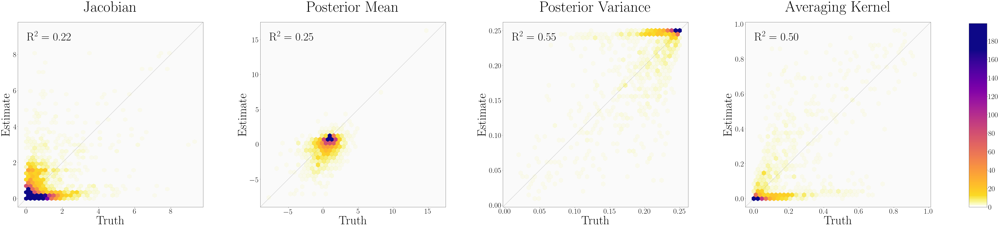

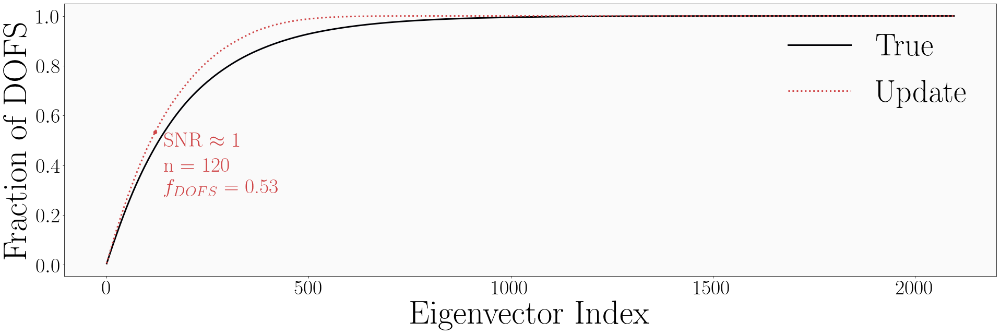

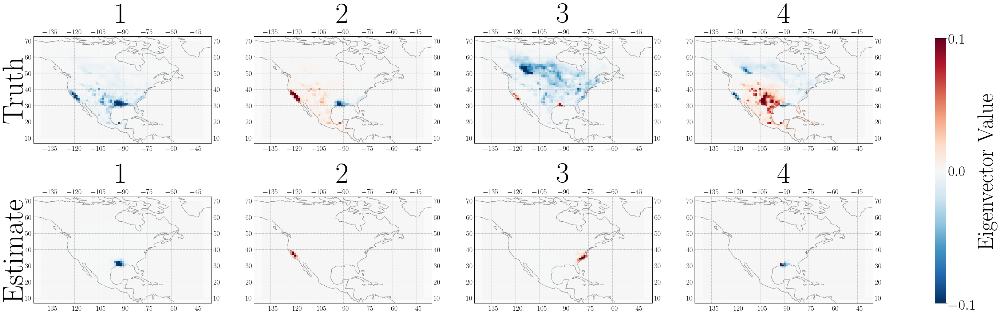

In [8]:
est0 = inv.ReducedRankJacobian(k_est.values,
                               xa.values,
                               sa_vec.values,
                               y.values,
                               y_base.values,
                               so_vec.values)
est0.xa_abs = emis *1e3
est0.rf = RF
est0.edecomp()
est0.solve_inversion()

est0.full_analysis(true, clusters_plot)

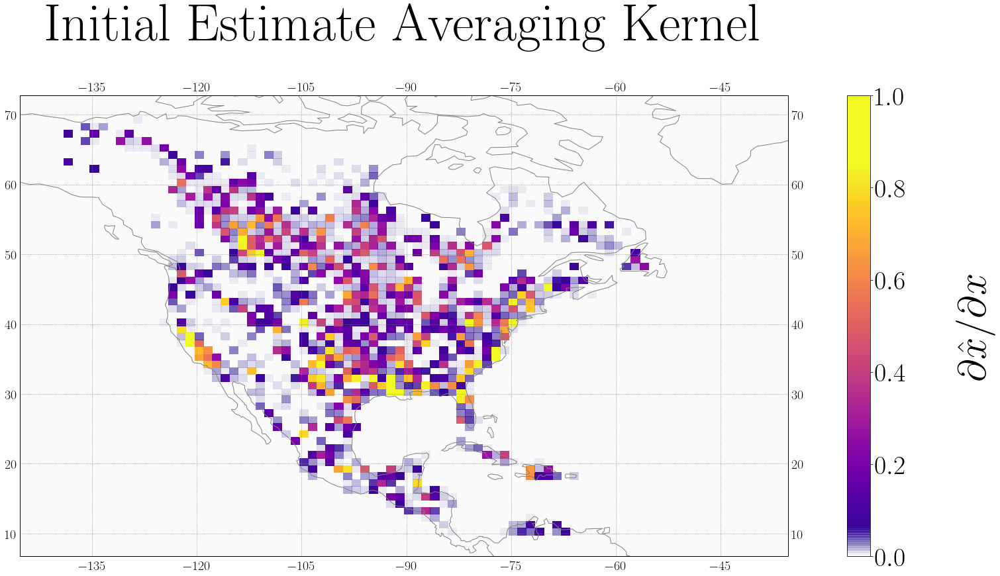

In [71]:
est0.dofs = np.diag(est0.a)
fig, ax, c = est0.plot_state('dofs', 
                               clusters_plot, 
                               default_value=0,
                               **{'title' : 'Initial Estimate Averaging Kernel',
                                  'cmap' : plasma_trans,
                                  'add_colorbar' : False,
                                  'vmin' : 0,
                                  'vmax' : 1})
c.set_label(r'$\partial\hat{x}/\partial x$',
            fontsize=(BASEFONT+5)*SCALE,
            labelpad=75)

(<Figure size 720x144 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c1ddfea20>)

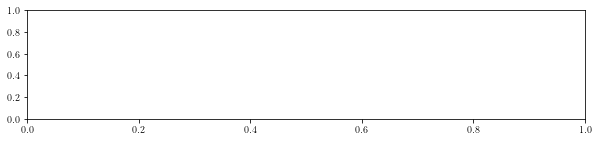

In [86]:
plt.subplots(figsize=(10, 2))

In [87]:
tmp = {}
len(tmp)

0

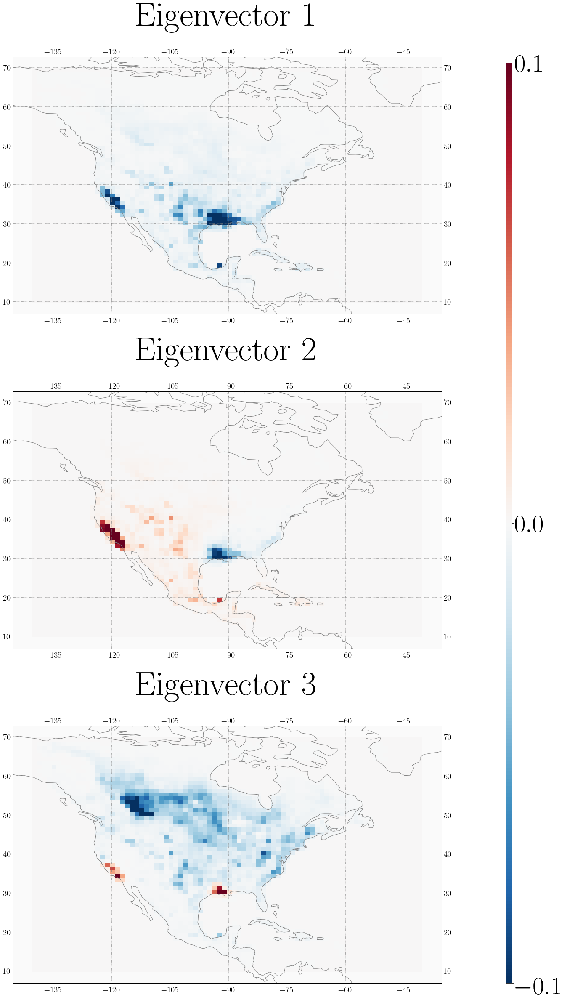

In [84]:
# EIGENVECTOR PLOT (2x2)
plot_data = [('evecs', i) for i in range(3)]
titles = ['Eigenvector %d' % (i+1) for i in range(4)]
kw = {'titles' : titles,
      'vmin' : -0.1,
      'vmax' : 0.1,
      'cmap' : 'RdBu_r',
      'cbar_kwargs' : {'ticks' : [-0.1, 0, 0.1]}}

fig, ax, c = true.plot_grid(plot_data, 
                            nx=3, ny=1, 
                            clusters_plot=clusters_plot,
                            **kw)
c.tick_params(labelsize=(BASEFONT+5)*SCALE)
c.set_ylabel('', fontsize=(BASEFONT+20)*SCALE)

plt.subplots_adjust(hspace=0.3, wspace=0.05)


In [1]:
# # # # EIGENVALUE SPECTRUM 
# # # fig, ax = plt.subplots(figsize=(7*SCALE/1.25, 2.5*SCALE/1.25))
# # # fig, ax = est0.plot_eval_spectra(**{'figax' : [fig, ax]})
# # # ax.set_xlim(0, 2098)
# # # ax.set_ylim(0, 1)
# # # ax.set_ylabel('Eigenvalues')
# # # # ax.axhline(y=0.2, 
# # # #            xmin=0, 
# # # # #            xmax=np.argwhere(est0.evals_q < 0.2)[0][0]/2098,
# # # #            xmax=2*est0.model_runs/2098,
# # # #            color=color(7))
# # # # # ax.axvline(x=np.argwhere(est0.evals_q < 0.2)[0][0],
# # # # ax.axvline(x=2*est0.model_runs/2098)
# # # #            ymin=0,
# # # #            ymax=0.2,
# # # #            color=color(7))
# # # ax.text(2*est0.model_runs, -0.025,
# # #         str(2*est0.model_runs),
# # #         c=color(7),
# # #         ha='center', va='top',
# # #         fontsize=BASEFONT*SCALE)

# fig, ax = plt.subplots(figsize=(10*SCALE/1.25, 3*SCALE/1.25))
# fig, ax = true.plot_info_frac(figax=[fig, ax],
#                                label='True',
#                                color=color(0),
#                                text=False)
# est0.plot_info_frac(figax=[fig, ax],
#                     label='Initial Estimate',
#                     ls=':', lw=4,
#                     color=color(6),
#                     text=False)
# ax.set_ylabel('Fraction of DOFS', fontsize=(BASEFONT+6)*SCALE,
#               labelpad=LABEL_PAD)
# ax.set_xlabel('Eigenvector Index', fontsize=(BASEFONT+6)*SCALE,
#               labelpad=LABEL_PAD)
# ax.tick_params(axis='both', which='both', labelsize=BASEFONT*SCALE)

In [14]:
# # MASS BALANCE JACOBIAN
# fig, ax, c = true.plot_comparison('k', est0.k, 
#                                   stats=False,
#                                   **{'title' : r'Mass-Balance Jacobian',
#                                      'xlabel' : 'Truth',
#                                      'ylabel' : 'Estimate'})

In [ ]:
# New convergence test


In [76]:
# First set of updates
est1 = est0.update_jacobian(true.k, 
                            snr=1.25)

# Second set
est2 = est1.update_jacobian(true.k, 
                            rank=est0.get_rank(pct_of_info=0.975))


# fig, ax = plt.subplots(figsize=(10, 5))
# ax.hist(np.diag(est2.a), bins=50);

Calculating prolongation and reduction.
Calculated rank from signal-to-noise ratio : 102
Forcing negative values of the Jacobian to 0.
Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -5.65e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 297587.95
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 189780.51
     Negative cells: -179
Calculating the averaging kernel.
     DOFS: 67.08
Calculating updated modeled observations.
Inversion complete.
Calculated rank from percent of information: 446
Calculating prolongation and reduction.
Using defined rank: 446
Forcing negative values of the Jacobian to 0.
Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -4.18e-14. Setting negative eigenvalues to zero.
Saving 

Reduced rank inversion is not solved.


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:4840: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


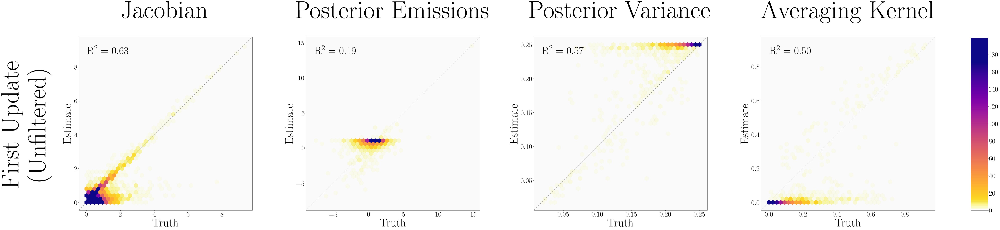

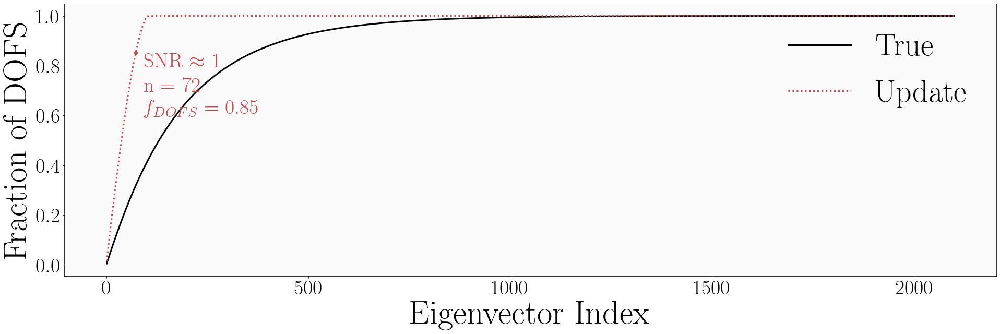

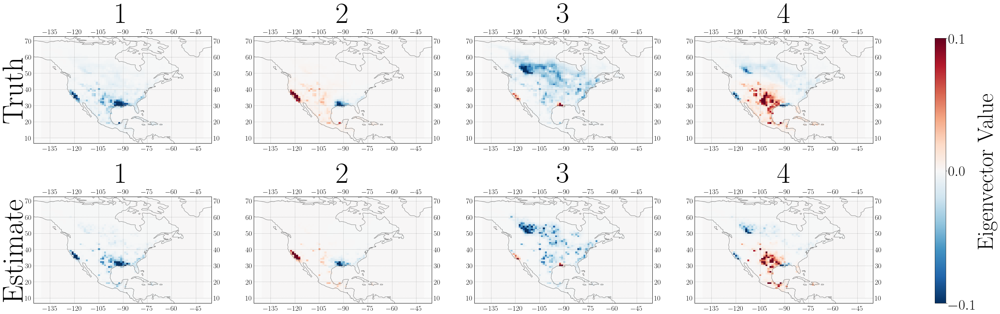

In [77]:
fig1, fig2, fig3 = est1.full_analysis(true, clusters_plot)
fig1.axes[0].text(-0.3, 0.5, 'First Update\n(Unfiltered)', 
                  fontsize=(BASEFONT+25)*SCALE,
                  rotation=90, ha='center', va='center',
                  transform=fig1.axes[0].transAxes)
titles = ['Jacobian', 'Posterior Emissions',
          'Posterior Variance', 'Averaging Kernel']
for i in range(4):
    fig1.axes[i].set_title(titles[i], 
                           fontsize=(BASEFONT+25)*SCALE,
                           y=1.1)

In [80]:
fig1.axes.get_position()

AttributeError: 'list' object has no attribute 'get_position'

Reduced rank inversion is not solved.


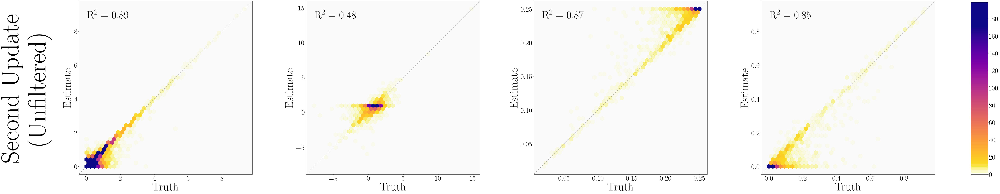

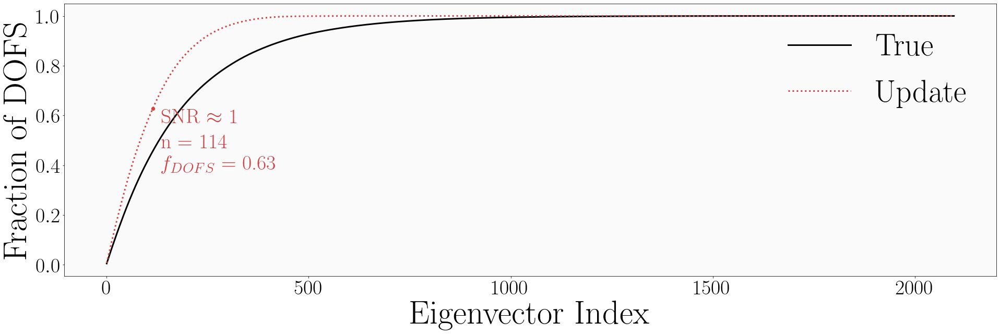

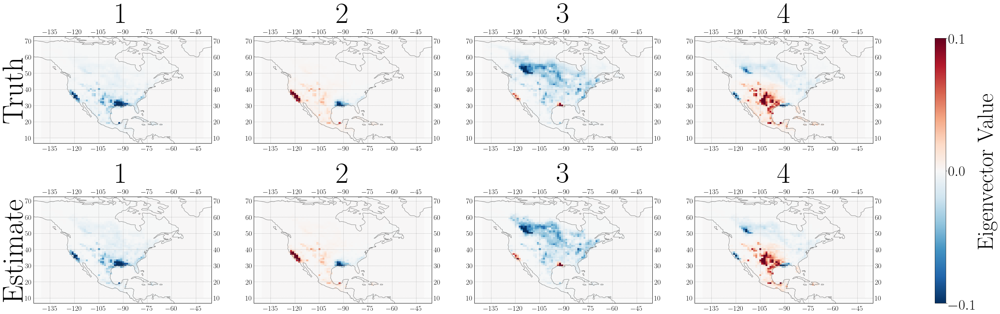

In [11]:
# est2.solve_inversion_fr(rank=300)
# true.solve_inversion_fr(rank=300)
fig1, fig2, fig3 = est2.full_analysis(true, clusters_plot)

fig1.axes[0].text(-0.3, 0.5, 'Second Update\n(Unfiltered)', 
                  fontsize=(BASEFONT+25)*SCALE,
                  rotation=90, ha='center', va='center',
                  transform=fig1.axes[0].transAxes)
for i in range(4):
    fig1.axes[i].set_title('')

-----------------------
MODEL RUNS:  548
CONSTRAINED CELLS:  530
DOFS:  129.72665210241377
-----------------------
Reduced rank inversion is not solved.


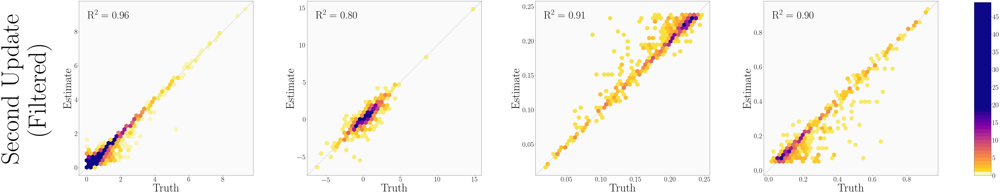

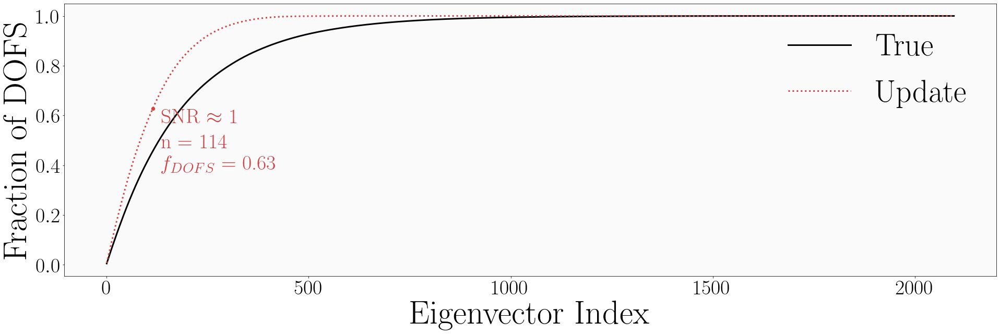

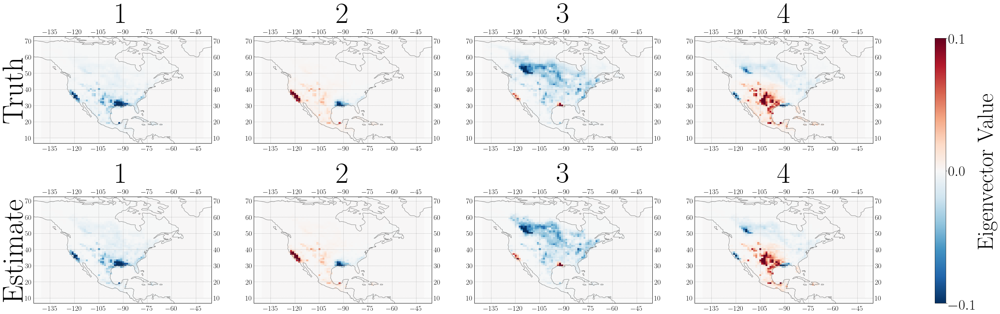

In [13]:
mask = np.diag(est2.a) > 0.05
est2_f, true_f = est2.filter(true, mask)

print('-----------------------')
print('MODEL RUNS: ', est2.model_runs)
print('CONSTRAINED CELLS: ', len(est2_f.xhat))
print('DOFS: ', np.trace(est2_f.a))
print('-----------------------')

fig1, fig2, fig3 = est2_f.full_analysis(true_f, clusters_plot)

fig1.axes[0].text(-0.3, 0.5, 'Second Update\n(Filtered)', 
                  fontsize=(BASEFONT+25)*SCALE,
                     rotation=90, ha='center', va='center',
                     transform=fig1.axes[0].transAxes)
for i in range(4):
    fig1.axes[i].set_title('')

# n = math.floor(2.5*est1.model_runs)
# _, prol, red, _ = est2.projection(rank=n)
# est3 = est2.update_jacobian(true.k,
#                             prolongation=prol[:, (n-est1.model_runs):],
#                             reduction=red[(n-est1.model_runs):, :])
# est2 = est1.update_jacobian(true.k, pct_of_info=0.95)
# figa, figb, figc = est1.full_analysis(true, clusters_plot)
# fig1, fig2, fig3 = est2.full_analysis(true, clusters_plot)
# fig4, fig5, fig6 = est3.full_analysis(true, clusters_plot)

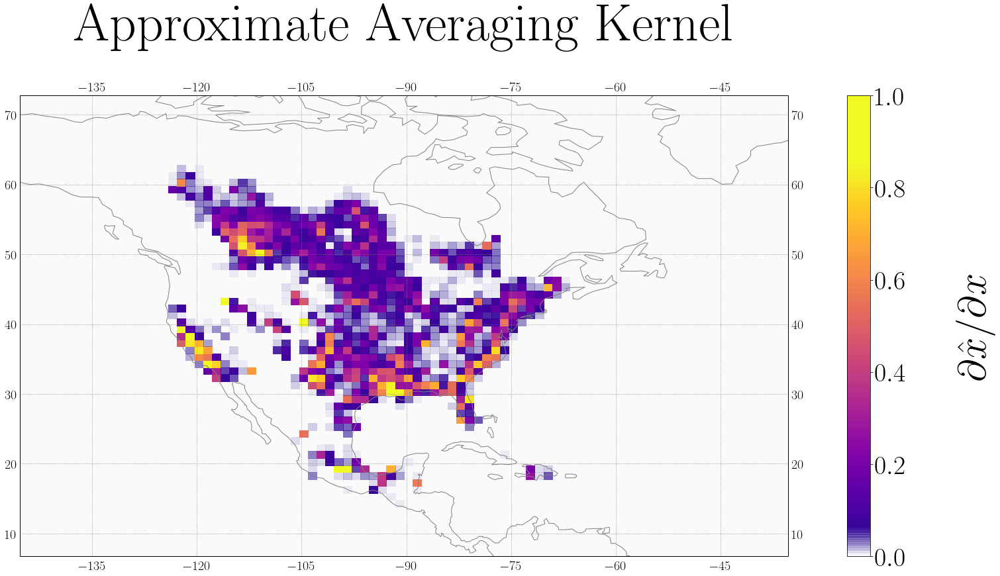

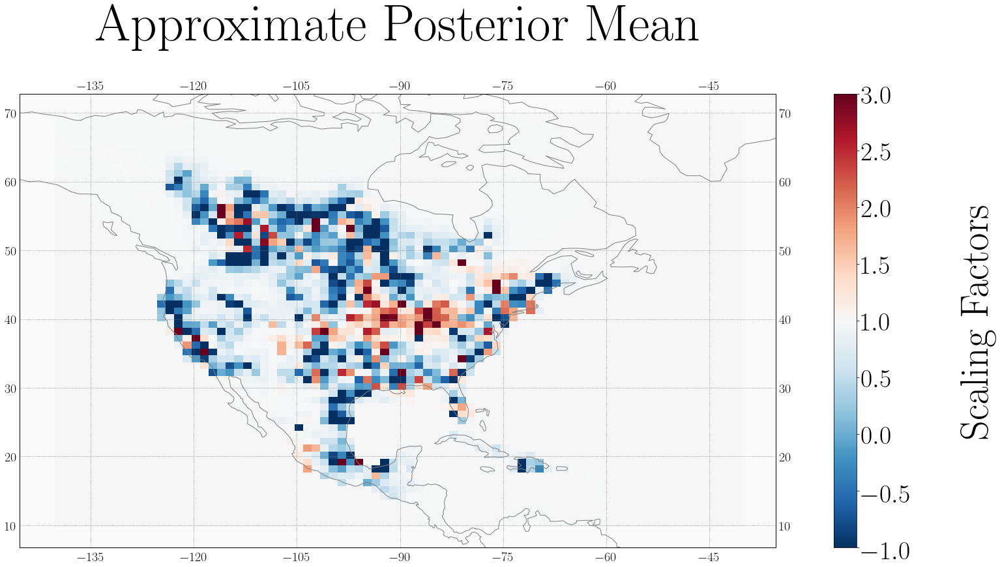

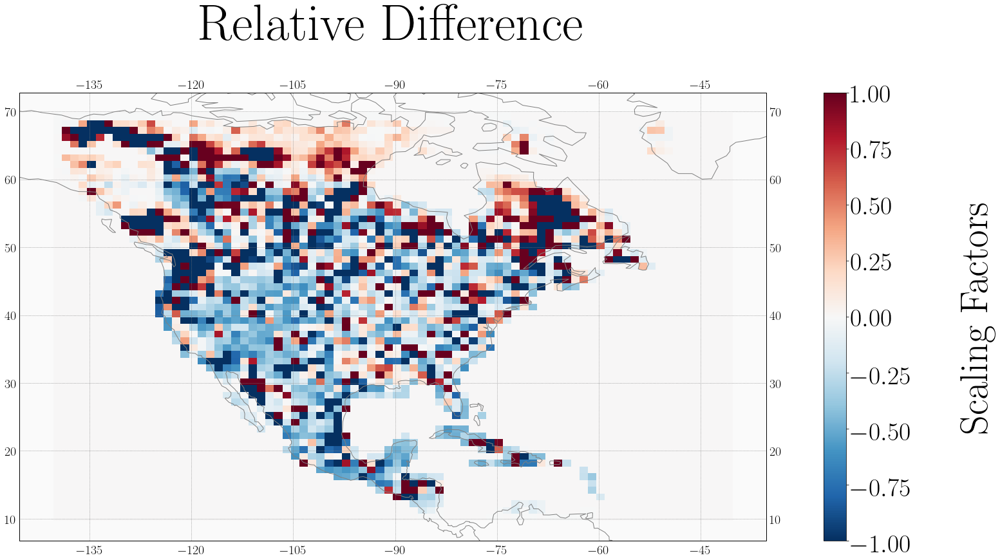

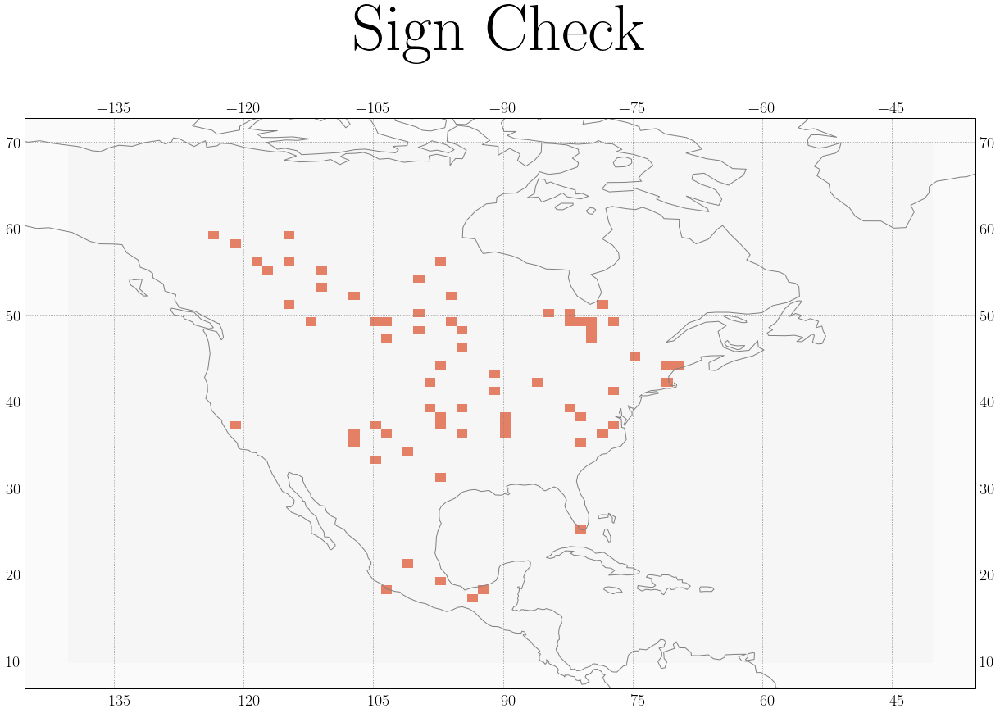

In [43]:
est2.dofs = np.diag(est2.a)
fig, ax, c = est2.plot_state('dofs', 
                               clusters_plot, 
                               default_value=0,
                               **{'title' : 'Approximate Averaging Kernel',
                                'cmap' : plasma_trans,
                                'add_colorbar' : False,
                                'vmin' : 0,
                                'vmax' : 1})
c.set_label(r'$\partial\hat{x}/\partial x$',
            fontsize=(BASEFONT+5)*SCALE,
            labelpad=75)

fig, ax, c = est2.plot_state('xhat', 
                               clusters_plot, 
                               default_value=1,
                               **{'title' : 'Approximate Posterior Mean',
                                  'cmap' : 'RdBu_r',
                                  'vmin' : -1,
                                  'vmax' : 3})
c.set_label('Scaling Factors', 
            fontsize=(BASEFONT+5)*SCALE, 
            labelpad=75)

est2.xhat_diff = est2.xhat - true.xhat
est2.xhat_diff_rel = (est2.xhat - true.xhat)/true.xhat

fig, ax, c = est2.plot_state('xhat_diff_rel', 
                               clusters_plot, 
                               default_value=0,
                               **{'title' : 'Relative Difference',
                                  'cmap' : 'RdBu_r',
                                  'vmin' : -1,
                                  'vmax' : 1,
                                  'add_colorbar' : False})
c.set_label('Scaling Factors', 
            fontsize=(BASEFONT+5)*SCALE, 
            labelpad=75)

# est2.xhat_shift = est2.xhat - 1
# true.xhat_shift = true.xhat - 1
# est2.xhat_sign_check = est2.xhat_shift*true.xhat_shift
correct_sign = (((est2.xhat > 1) & (true.xhat > 1)) |
                ((est2.xhat < 1) & (true.xhat < 1)))
est2.xhat_sign_check = np.ones(est2.nstate) # all wrong signs
est2.xhat_sign_check[correct_sign] = 0 # set correct signs to 0
est2.xhat_sign_check[~mask] = 0 # set small values of avker to 0
 
fig, ax, c = est2.plot_state('xhat_sign_check', 
                             clusters_plot, 
                             default_value=0,
                             cbar=False,
                               **{'title' : 'Sign Check',
                                  'cmap' : 'RdBu_r',
                                  'vmin' : -2,
                                  'vmax' : 2,
                                  'add_colorbar' : False})


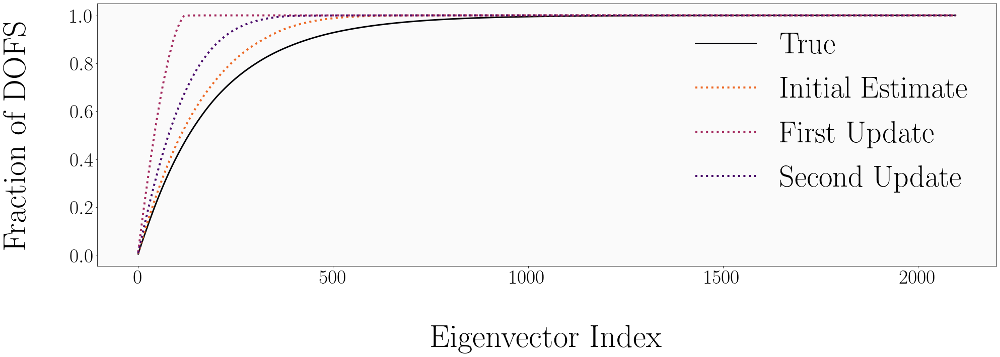

In [47]:
fig, ax = plt.subplots(figsize=(10*SCALE/1.25, 3*SCALE/1.25))
fig, ax = true.plot_info_frac(figax=[fig, ax],
                               label='True',
                               color=color(0),
                               text=False)
est0.plot_info_frac(figax=[fig, ax],
                    label='Initial Estimate',
                    ls=':', lw=4,
                    color=color(6),
                    text=False)
est1.plot_info_frac(figax=[fig, ax],
                    label='First Update',
                    ls=':', lw=4,
                    color=color(4),
                    text=False)
est2.plot_info_frac(figax=[fig, ax],
                    label='Second Update',
                    ls=':', lw=4,
                    color=color(2),
                    text=False)
ax.set_ylabel('Fraction of DOFS', fontsize=(BASEFONT+6)*SCALE,
              labelpad=LABEL_PAD)
ax.set_xlabel('Eigenvector Index', fontsize=(BASEFONT+6)*SCALE,
              labelpad=LABEL_PAD)
ax.tick_params(axis='both', which='both', labelsize=BASEFONT*SCALE)

Text(-0.3, 0.5, 'Second\nUpdate')

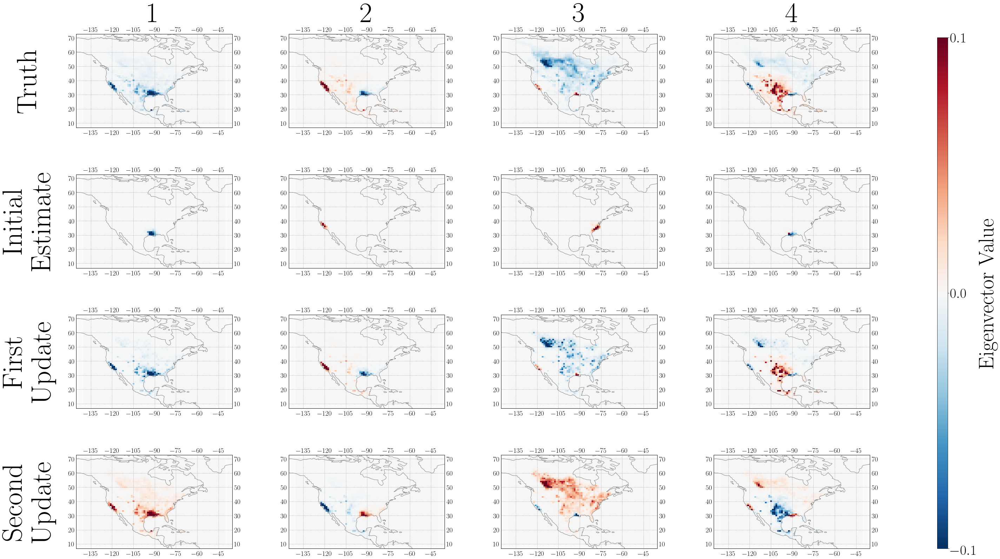

In [26]:
# Plot the first few eigenvectors to give an idea of the
# eigenspace
nx = 4
ny = 4
plot_data = [('evecs', i) for i in range(ny)]
titles = ['%d' % (i+1) for i in range(ny)]

kw = {'vmin' : -0.1,
      'vmax' : 0.1,
      'cmap' : 'RdBu_r',
      'add_colorbar' : False}
cbar_kwargs = {'ticks' : [-0.1, 0, 0.1]}

fig3, ax = plt.subplots(nx, ny, figsize=(ny*2*5.25,nx*6.75),
                       subplot_kw={'projection' : ccrs.PlateCarree()})
plt.subplots_adjust(hspace=0.5, wspace=0.15)
cax = fig3.add_axes([0.95, 0.25/2, 0.01, 0.75])


for i in range(ny):
    kw['title'] = titles[i]
    kw['figax'] = [fig3, ax[0, i]]
    fig3, ax[0, i], c = true.plot_state(plot_data[i], clusters_plot,
                                        cbar=False, **kw)
    
    kw['title'] = ''
    kw['figax'] = [fig3, ax[1, i]]
    fig3, ax[1, i], c = est0.plot_state(plot_data[i], clusters_plot, 
                                        cbar=False, **kw)

    kw['figax'] = [fig3, ax[2, i]]
    fig3, ax[2, i], c = est1.plot_state(plot_data[i], clusters_plot, 
                                        cbar=False, **kw)
    
    kw['figax'] = [fig3, ax[3, i]]
    fig3, ax[3, i], c = est2.plot_state(plot_data[i], clusters_plot, 
                                        cbar=False, **kw)

    
for axis in ax.flatten():
    axis.set_title(axis.get_title(), fontsize=(BASEFONT+10)*SCALE)

fig3.colorbar(c, cax=cax, **cbar_kwargs)
cax.tick_params(labelsize=40)
cax.set_ylabel('Eigenvector Value', fontsize=(BASEFONT+5)*SCALE)

# Add label
ax[0, 0].text(-0.3, 0.5, 'Truth', fontsize=(BASEFONT+10)*SCALE,
              rotation=90, ha='center', va='center',
              transform=ax[0,0].transAxes)
ax[1, 0].text(-0.3, 0.5, 'Initial\nEstimate', fontsize=(BASEFONT+10)*SCALE,
              rotation=90, ha='center', va='center',
              transform=ax[1,0].transAxes)
ax[2, 0].text(-0.3, 0.5, 'First\nUpdate', fontsize=(BASEFONT+10)*SCALE,
              rotation=90, ha='center', va='center',
              transform=ax[2,0].transAxes)
ax[3, 0].text(-0.3, 0.5, 'Second\nUpdate', fontsize=(BASEFONT+10)*SCALE,
              rotation=90, ha='center', va='center',
              transform=ax[3,0].transAxes)


In [ ]:
# fig, ax, c = true.plot_comparison('k', est1.k, 
#                                   stats=False,
#                                   **{'title' : r'First Jacobian Update',
#                                      'xlabel' : 'Truth',
#                                      'ylabel' : 'Estimate'})

In [11]:
# mask = est2.k.sum(axis=0) > 1e-3
# mask = np.abs(est2.xhat - 1) > 1e-1
# est2.dofs = np.diag(est2.a)
# mask = est2.dofs > np.percentile(est2.dofs, q=80)
# # mask = est2.dofs > 5e-2
# mask = np.abs(est2.xhat - 1) > 0.1

In [ ]:
# try a new convergence test

In [17]:
r2_summ = np.zeros((10, 10))
nc_summ = np.zeros((10, 10))
nm_summ = np.zeros((10, 10))
dofs_summ = np.zeros((10, 10))
for first_update in range(100, 1100, 100):
    for second_update in range(100, 1100, 100):
        est1 = est0.update_jacobian(true.k, rank=first_update)
        est2 = est1.update_jacobian(true.k, rank=second_update)
        mask = np.diag(est2.a) > 0.005
        est2_f, true_f = est2.filter(true, mask)
        _, _, r = est2_f.calc_stats(true_f.xhat, est2_f.xhat)
        
        col = int(first_update/100 - 1)
        row = int(second_update/100 - 1)
        
        r2_summ[row, col] = r**2
        nc_summ[row, col] = len(est2_f.xhat)
        nm_summ[row, col] = est2_f.model_runs
        dofs_summ[row, col] = np.trace(est2_f.a)

Calculating prolongation and reduction.
Using defined rank: 100
Forcing negative values of the Jacobian to 0.
Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -7.32e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 595175.90
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 373682.83
     Negative cells: -211
Calculating the averaging kernel.
     DOFS: 76.91
Calculating updated modeled observations.
Inversion complete.
Calculating prolongation and reduction.
Using defined rank: 100
Forcing negative values of the Jacobian to 0.
Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -6.19e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at

Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 373682.83
     Negative cells: -211
Calculating the averaging kernel.
     DOFS: 76.91
Calculating updated modeled observations.
Inversion complete.
Calculating prolongation and reduction.
Using defined rank: 700
Forcing negative values of the Jacobian to 0.
Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -6.26e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 595175.90
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 335394.65
     Negative cells: -608
Calculating the averaging kernel.
     DOFS: 211.75
Calculating updated modeled observations.
Inversion complete.
Calculating prolongation and reduction.
Using defined rank: 100
Forcing negati

Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -4.97e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 595175.90
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 342413.76
     Negative cells: -387
Calculating the averaging kernel.
     DOFS: 150.89
Calculating updated modeled observations.
Inversion complete.
Calculating prolongation and reduction.
Using defined rank: 200
Forcing negative values of the Jacobian to 0.
Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -1.08e-13. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 595175.90
Calculating the posterior error.
Calculating the posterior mea

KeyboardInterrupt: 

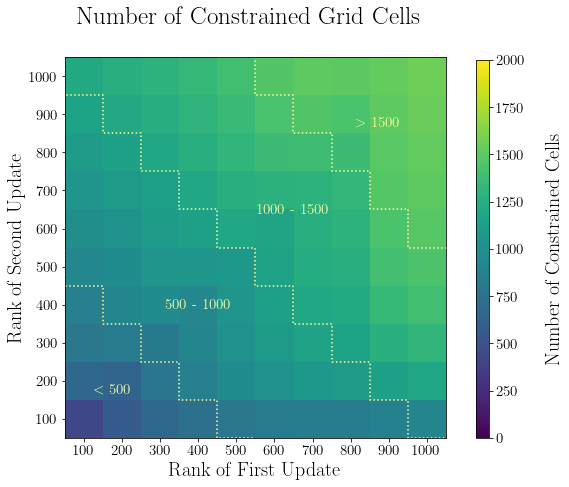

In [177]:
fig, ax = plt.subplots(1, 1, figsize=(7, 7))
cax = fig.add_axes([0.95, 0.25/2, 0.025, 0.75])

# fig.suptitle('Estimated vs. True Posterior Mean Correlation',
#              fontsize=25)
# fig.suptitle('Estimated DOFS', fontsize=25)
fig.suptitle('Number of Constrained Grid Cells', fontsize=25)

# c = ax.imshow(r2_summ, vmin=0, vmax=1)
# c = ax.imshow(dofs_summ, vmin=0, vmax=270, cmap='plasma')
c = ax.imshow(nc_summ, vmin=0, vmax=2000)

# 1500 model run contour
ax.step(np.arange(3.5, 10.5, 1),
        np.arange(10.5, 3.5, -1),
        c=color(9), 
        ls=':')
ax.text(5.5, 5.5, '1000 - 1500', fontsize=15, color=color(9),
        ha='center', va='center')
ax.text(7.75, 7.75, r'$>$ 1500', fontsize=15, color=color(9),
        ha='center', va='center')

# 1000 model run contour
ax.step(np.arange(-1.5, 10.5, 1), 
        np.arange(10.5, -1.5, -1),
        c=color(9),
        ls=':')
ax.text(3, 3, '500 - 1000', fontsize=15, color=color(9),
        ha='center', va='center')

# 500 model run contour
ax.step(np.arange(-1.5, 5.5, 1),
        np.arange(5.5, -1.5, -1),
        c=color(9), 
        ls=':')
ax.text(0.75, 0.75, r'$<$ 500', fontsize=15, color=color(9),
        ha='center', va='center')

fig.colorbar(c, cax=cax)

# Axis and tick labels
ax.set_xlabel('Rank of First Update', fontsize=20)
ax.set_xticks(np.arange(0, 10))
ax.set_xticklabels(np.arange(100, 1100, 100), fontsize=15)
ax.set_xlim(-0.5, 9.5)

ax.set_ylabel('Rank of Second Update', fontsize=20)
ax.set_yticks(np.arange(0, 10))
ax.set_yticklabels(np.arange(100, 1100, 100), fontsize=15)
ax.set_ylim(-0.5, 9.5)

# Color bar
# cax.set_ylabel(r'Posterior Emission r$^2$', fontsize=20, labelpad=20)
# cax.set_ylabel('DOFS', fontsize=20, labelpad=20)
cax.set_ylabel('Number of Constrained Cells', 
               fontsize=20, labelpad=20)
cax.tick_params(labelsize=15);

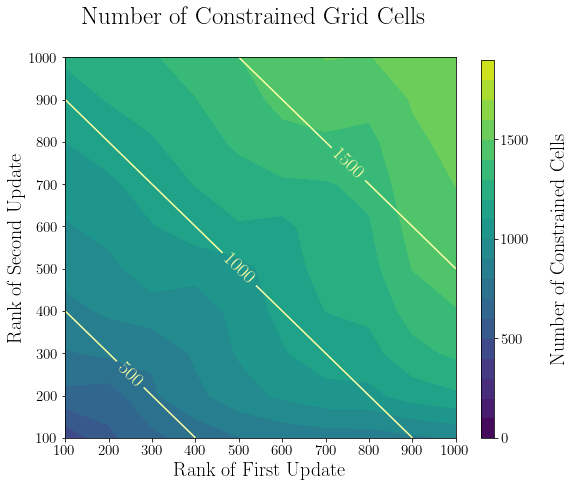

In [176]:
fig, ax = plt.subplots(1, 1, figsize=(7, 7))
cax = fig.add_axes([0.95, 0.25/2, 0.025, 0.75])

# fig.suptitle('Estimated vs. True Posterior Mean Correlation',
#              fontsize=25)
# fig.suptitle('Estimated DOFS', fontsize=25)
fig.suptitle('Number of Constrained Grid Cells', fontsize=25)

# cf = ax.contourf(r2_summ, levels=np.linspace(0, 1, 21), vmin=0, vmax=1)
# cf = ax.contourf(dofs_summ, levels=np.arange(0, 300, 20),
#                  vmin=0, vmax=270, cmap='plasma')
cf = ax.contourf(nc_summ, levels=np.arange(0, 2000, 100),
                 vmin=0, vmax=2000)
cl = ax.contour(nm_summ, levels=3, colors=color(9))
ax.clabel(cl, cl.levels, 
          inline=True, 
          manual=[(1.5, 1.5), (4.5, 4.5), (7.5, 7.5)],
          fmt='%d', fontsize=20)

# cbar = fig.colorbar(cf, cax=cax, ticks=np.linspace(0, 1, 6))
# cbar = fig.colorbar(cf, cax=cax, ticks=np.arange(0, 300, 50))
cbar = fig.colorbar(cf, cax=cax, ticks=np.arange(0, 2000, 500))

# Axis and tick labels
ax.set_xlabel('Rank of First Update', fontsize=20)
ax.set_xticks(np.arange(0, 10))
ax.set_xticklabels(np.arange(100, 1100, 100), fontsize=15)
ax.set_xlim(0, 9)

ax.set_ylabel('Rank of Second Update', fontsize=20)
ax.set_yticks(np.arange(0, 10))
ax.set_yticklabels(np.arange(100, 1100, 100), fontsize=15)
ax.set_ylim(0, 9)

# Color bar
# cax.set_ylabel(r'Posterior Emission r$^2$', 
#                fontsize=20, labelpad=20)
# cax.set_ylabel('DOFS', fontsize=20, labelpad=20)
cax.set_ylabel('Number of Constrained Cells', 
               fontsize=20, labelpad=20)
cax.tick_params(labelsize=15);

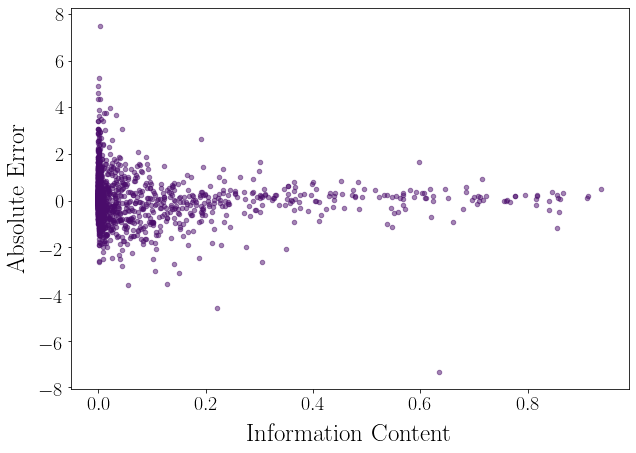

In [26]:
fig, ax = plt.subplots(figsize=(10, 7))

est2.dofs = np.diag(est2.a)

ax.scatter(est2.dofs, est2.xhat - true.xhat,
           alpha=0.5, s=5*SCALE, c=color(2))
ax.set_xlabel('Information Content', fontsize=BASEFONT+15,
              labelpad=10)
ax.set_ylabel('Absolute Error', fontsize=BASEFONT+15,
              labelpad=10)
ax.tick_params('both', labelsize=BASEFONT+10)

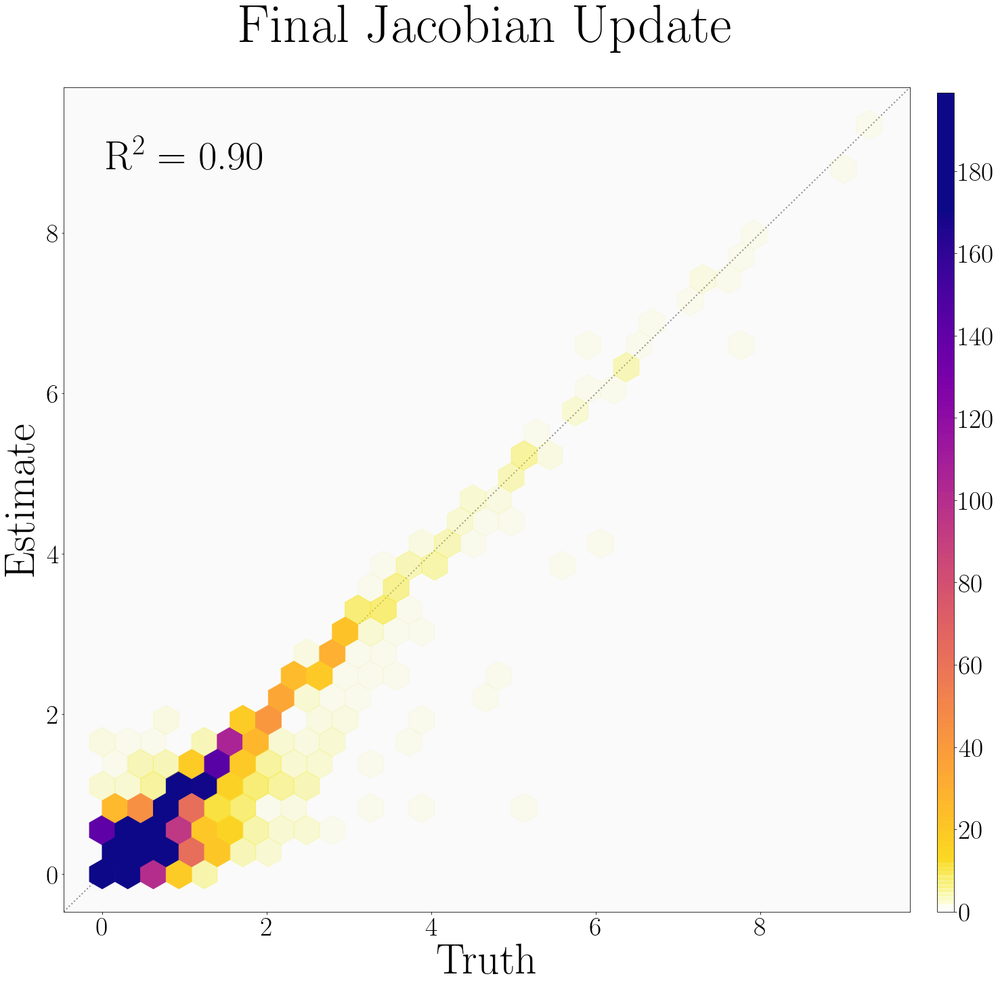

In [15]:
fig, ax, c = true_f.plot_comparison('k', est2_f.k, 
                                    **{'title' : r'Final Jacobian Update',
                                       'xlabel' : 'Truth',
                                       'ylabel' : 'Estimate'})

In [38]:
est2_f.model_runs

306

In [41]:
est2_f.xhat.shape

(527,)

In [15]:
# plot_data = [('evecs', i) for i in range(100)]
# titles = ['Eigenvector %d' % (i+1) for i in range(100)]
# kw = {'titles' : titles,
#       'vmin' : -0.1,
#       'vmax' : 0.1,
#       'cmap' : 'RdBu_r',
#       'cbar_kwargs' : {'ticks' : [-0.1, 0, 0.1]}}

# fig, ax, c = est1.plot_grid(plot_data, 
#                             nx=20, ny=5, 
#                             clusters_plot=clusters_plot,
#                             **kw)


In [16]:
# fig, ax, c = est2.plot_grid(plot_data, 
#                             nx=20, ny=5, 
#                             clusters_plot=clusters_plot,
#                             **kw)


(0, 1)

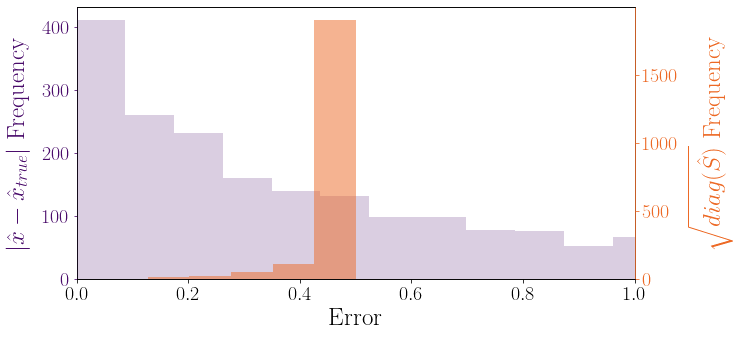

In [39]:
# plt.hist(np.diag(estab_f.shat_short), 30)
fig, ax = plt.subplots(figsize=(10, 5))

hist1 = ax.hist(np.abs(est2.xhat - true.xhat), 100, 
                color=color(2), alpha=0.2,
                label='Absolute Error of Low-Rank Posterior')
ax.spines['left'].set_color(color(2))
ax.yaxis.label.set_color(color(2))
ax.tick_params(axis='y', colors=color(2), labelsize=20)
ax.set_ylabel(r'$\vert\hat{x} - \hat{x}_{true}\vert$ Frequency', 
              fontsize=25, labelpad=10)

ax2 = ax.twinx()
hist2 = ax2.hist(np.diag(est2.shat)**0.5, 5, 
                 color=color(6), alpha=0.5,
                 label='Standard Deviation of Low-Rank Posterior')
ax2.spines['right'].set_color(color(6))
ax2.yaxis.label.set_color(color(6))
ax2.tick_params(axis='y', colors=color(6), labelsize=20)
ax2.set_ylabel(r'$\sqrt{diag(\hat{S})}$ Frequency', 
               fontsize=25, labelpad=10)

# hists = hist1 + hist2
# labels = [h.get_label() for h in hists]
# ax.legend(hists, labels);

ax.tick_params(axis='x', labelsize=20)
ax.set_xlabel('Error', fontsize=25)
ax.set_xlim(0, 1)

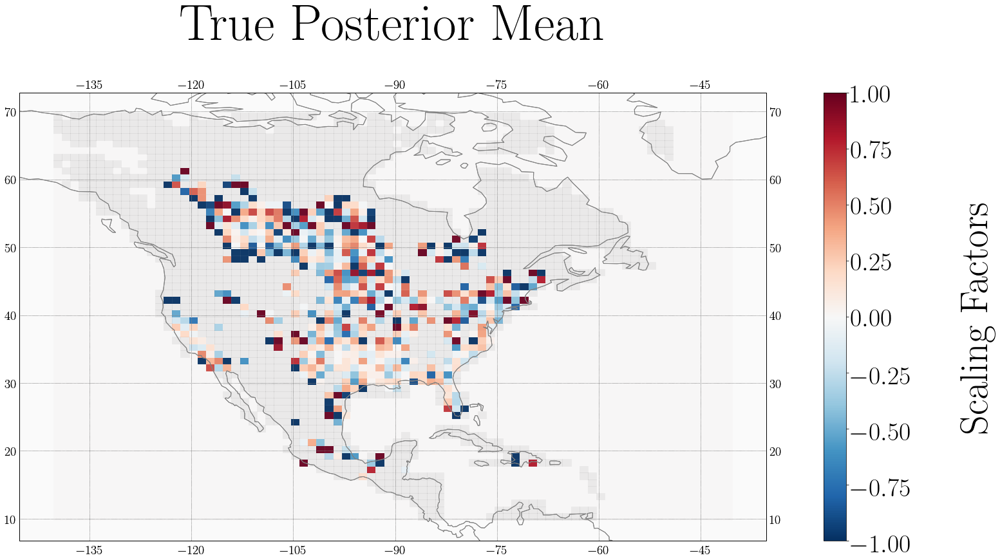

In [44]:
supy = 1.03
supsize = 100
suby = 1.05
subsize = 80
cbarsize = 50
cbarpad = 0.025

est2_f.xhat_long_diff = est2_f.xhat_long - true.xhat
est2_f.xhat_long_diff[~mask] = 0

est2_f.xhat_long_diff_rel = est2_f.xhat_long_diff/true.xhat
est2_f.xhat_long_diff_rel[~mask] = 0

fig, ax, c = est2_f.plot_state('xhat_long_diff', 
                               clusters_plot, 
                               default_value=0,
                               **{'title' : '',
                                  'cmap' : 'RdBu_r',
                                  'vmin' : -1,
                                  'vmax' : 1,
                                  'add_colorbar' : False})
c.set_label('Scaling Factors', 
            fontsize=(BASEFONT+5)*SCALE, 
            labelpad=75)

# cb = plt.colorbar(c, pad=cbarpad)
# cb.ax.tick_params(labelsize=cbarsize)

est2_f.xhat_insig = np.ones(len(est2_f.xhat_long))
est2_f.xhat_insig[mask] = 0
# clusters_mask = np.isin(clusters_plot, np.argwhere(mask).flatten())
# clusters_plot_f = copy.deepcopy(clusters_plot)
# clusters_plot_f = clusters_plot_f.where(clusters_mask, 0)
fig, ax, c  = est2_f.plot_state('xhat_insig',
                                clusters_plot,
                                default_value=0,
                                cbar=False,
                                **{'cmap' : 'Greys',
                                   'figax' : [fig, ax],
                                   'alpha' : 0.05,
                                   'title' : 'True Posterior Mean',
                                   'hatch' : '/',
                                   'add_colorbar' : False})
# # fig.suptitle('Low-Rank Posterior Mean', fontsize=supsize, y=supy)
# # ax.set_title('Model Runs = %d, Optimized Grid Cells = %d'
# #              % (est2_f.model_runs, len(est2_f.xhat)),
# #             fontsize=subsize, y = suby)

# # fig, ax, c = true.plot_state('xhat', 
# #                                clusters_plot, 
# #                                default_value=1,
# #                                **{'title' : 'True Posterior Mean',
# #                                   'cmap' : 'RdBu_r',
# #                                   'vmin' : 0,
# #                                   'vmax' : 2,
# #                                   'add_colorbar' : False})
# # cb = plt.colorbar(c, pad=cbarpad)
# # cb.ax.tick_params(labelsize=cbarsize)

# # fig.suptitle('True Posterior Mean', fontsize=supsize, y=supy)
# # ax.set_title('Model Runs = %d'
# #              % (len(true.xhat)),
# #             fontsize=subsize, y = suby)


# from matplotlib.colors import LinearSegmentedColormap

# ncolors = 300
# color_array = plt.get_cmap('plasma')(range(ncolors))

# # change alpha values
# color_array[:,-1] = np.append(np.linspace(0.0,1.0,20), np.ones(ncolors-20))

# # create a colormap object
# map_object = LinearSegmentedColormap.from_list(name='plasma_trans',colors=color_array)

# # register this new colormap with matplotlib
# plt.register_cmap(cmap=map_object)

# true.a_tr = np.diag(true.a)
# fig, ax, col = true.plot_state('a_tr', clusters_plot, 
#                              **{'title' : '',
#                                 'cmap' : 'plasma_trans',
#                                 'add_colorbar' : False,
#                                 'vmin' : 0,
#                                 'vmax' : 1})
# fig.suptitle('True Averaging Kernel', y=supy, fontsize=supsize)
# cbar = plt.colorbar(col, pad=cbarpad)
# # cbar.set_label(label=r'$\partial \hat{x}/\partial x$', 
# #                fontsize=cbarsize, x=2)
# cbar.ax.tick_params(labelsize=cbarsize)
# # cbar.set_label(label='CH4 Emissions', fontsize=16)


# # est2_f.plot_state('xhat_long',
# #                   clusters_plot,
# #                   default_)

In [37]:
len(est2_f.xhat)

606

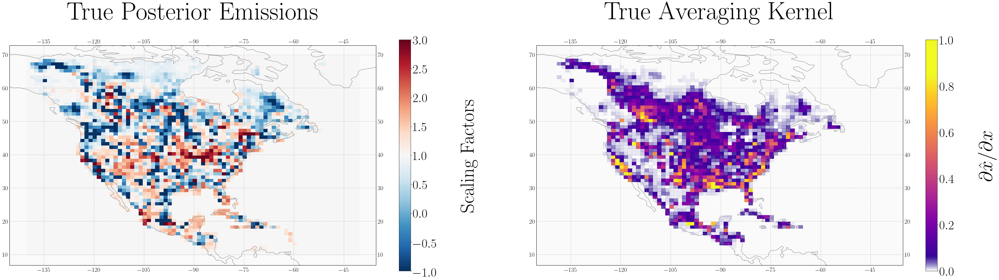

In [32]:
nx = 1
ny = 2
fig, ax = plt.subplots(nx, ny, figsize=(ny*2*7*SCALE/2, nx*6.75*SCALE/2),
                       subplot_kw={'projection' : ccrs.PlateCarree()})
plt.subplots_adjust(hspace=0.1, wspace=0.15)

fig, ax[0], c = true.plot_state('xhat', 
                                clusters_plot, 
                                default_value=1,
                                **{'figax' : [fig, ax[0]],
                                   'title' : 'True Posterior Emissions',
                                   'cmap' : 'RdBu_r',
                                   'vmin' : -1,
                                   'vmax' : 3})
c.set_label('Scaling Factors', 
            fontsize=(BASEFONT+5)*SCALE, 
            labelpad=75)

true.dofs = np.diag(true.a)
fig, ax[1], c = true.plot_state('dofs', clusters_plot, 
                             **{'figax' : [fig, ax[1]],
                                'title' : 'True Averaging Kernel',
                                'cmap' : plasma_trans,
                                'add_colorbar' : False,
                                'vmin' : 0,
                                'vmax' : 1})
c.set_label(r'$\partial\hat{x}/\partial x$',
            fontsize=(BASEFONT+5)*SCALE,
            labelpad=75)

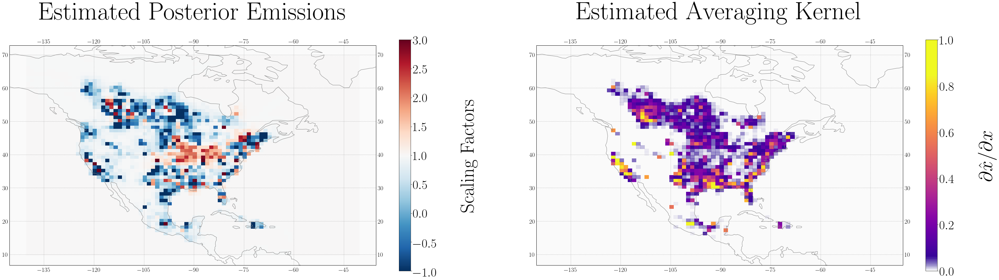

In [31]:
nx = 1
ny = 2
fig, ax = plt.subplots(nx, ny, figsize=(ny*2*7*SCALE/2, nx*6.75*SCALE/2),
                       subplot_kw={'projection' : ccrs.PlateCarree()})
plt.subplots_adjust(hspace=0.1, wspace=0.15)

fig, ax[0], c = est2.plot_state('xhat', 
                                clusters_plot, 
                                default_value=1,
                                **{'figax' : [fig, ax[0]],
                                   'title' : 'Estimated Posterior Emissions',
                                   'cmap' : 'RdBu_r',
                                   'vmin' : -1,
                                   'vmax' : 3})
c.set_label('Scaling Factors', 
            fontsize=(BASEFONT+5)*SCALE, 
            labelpad=75)

true.dofs = np.diag(true.a)
fig, ax[1], c = est2.plot_state('dofs', clusters_plot, 
                             **{'figax' : [fig, ax[1]],
                                'title' : 'Estimated Averaging Kernel',
                                'cmap' : plasma_trans,
                                'add_colorbar' : False,
                                'vmin' : 0,
                                'vmax' : 1})
c.set_label(r'$\partial\hat{x}/\partial x$',
            fontsize=(BASEFONT+5)*SCALE,
            labelpad=75)

In [19]:
est2_f.xhat_long_shift = est2_f.xhat_long - true.xhat
est2_f.xhat_long_diff_shift -= 1
true.xhat_shift

AttributeError: 'ReducedRankJacobian' object has no attribute 'xhat_long_diff_shift'

# OLD

In [85]:
len(estab_f.shat_short)

521

In [9]:
len(est2_f.xhat)

428

Calculating the cost function at the prior mean.
     Cost function: 47560.63
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 38042.68
     Negative cells: -63
Calculating the averaging kernel.
     DOFS: 52.54
Calculating updated modeled observations.
Inversion complete.


(<Figure size 720x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c4e991550>)

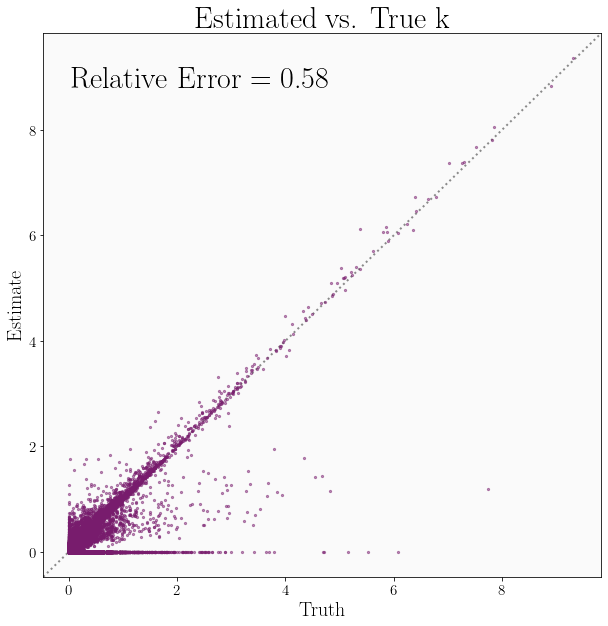

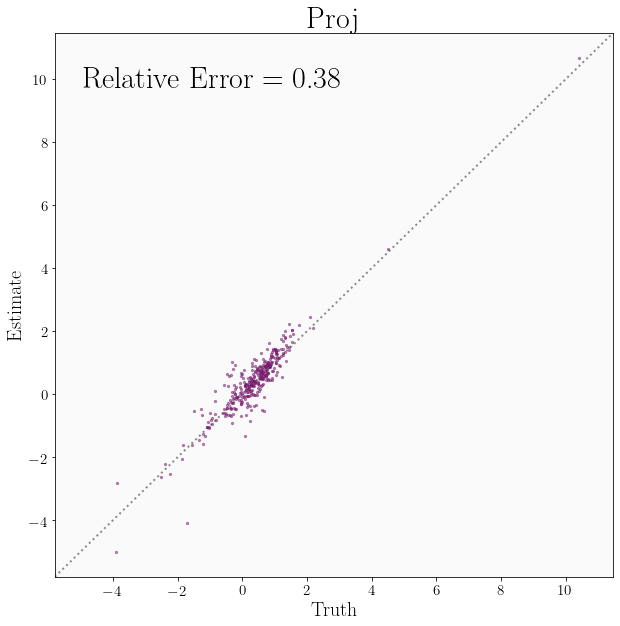

In [15]:
est300_f = copy.deepcopy(est300)
est300_f.dofs = np.diag(est300_f.a)
est300_f.k = np.where(est300_f.dofs <= 0.025, 0, est300_f.k)

est300_f.solve_inversion()
# est50_250_f.solve_inversion_fr(rank=400)
true.xhat_short = true.xhat[est300_f.xhat != 1]
est300_f.xhat_short = est300_f.xhat[est300_f.xhat != 1]

true.plot_comparison('k', est300_f.k)
true.plot_comparison('xhat_short', est300_f.xhat_short, **{'title' : 'Proj'})

In [17]:
true.shatvec = np.diag(true.shat)

./python/inversion.py:518: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cax = fig.add_axes([0.95, 0.25/2, 0.01, 0.75])


Text(0.5, 1.0, 'Estimated vs. True $\\hat{S}_{K_\\pi}$')

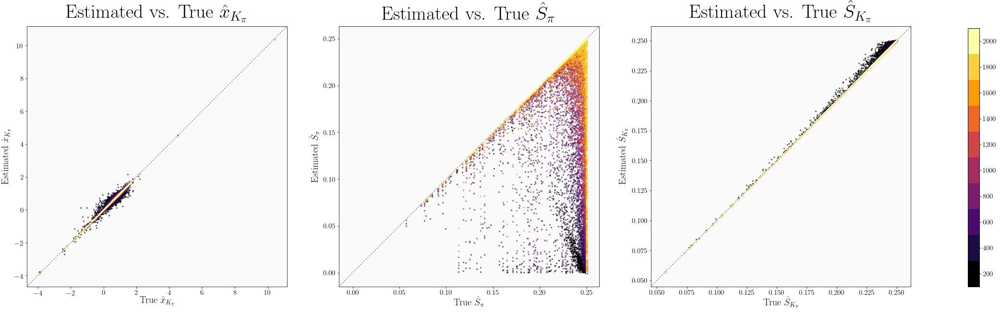

In [18]:
fig2, ax = plt.subplots(1, 3, figsize=(33, 10))
fig, ax[0] = true.plot_comparison('xhat', sol_kproj['xhat_kproj'], 
                                  **{'figax' : [fig2, ax[0]],
                                     'title' : r'Estimated vs. True $\hat{x}_{K_{\pi}}$',
                                     'xlabel' : r'True $\hat{x}_{K_\pi}$',
                                     'ylabel' : r'Estimated $\hat{x}_{K_\pi}$'})
ax[0].set_title(label=ax[0].get_title(), fontsize=40)
fig, ax[1] = true.plot_comparison('shatvec', sol_kproj['shat_proj'], 
                                  **{'figax' : [fig2, ax[1]],
                                     'title' : r'Estimated vs. True $\hat{S}_{\pi}$',
                                     'xlabel' : r'True $\hat{S}_{\pi}$',
                                     'ylabel' : r'Estimated $\hat{S}_{\pi}$'})
ax[1].set_title(label=ax[1].get_title(), fontsize=40)
fig, ax[2] = true.plot_comparison('shatvec', sol_kproj['shat_kproj'], 
                                  **{'figax' : [fig2, ax[2]],
                                     'title' : r'Estimated vs. True $\hat{S}_{K_\pi}$',
                                     'xlabel' : r'True $\hat{S}_{K_\pi}$',
                                     'ylabel' : r'Estimated $\hat{S}_{K_\pi}$'})
ax[2].set_title(label=ax[2].get_title(), fontsize=40)

# cbar = fig.axes[-1]
# cbar.set_ylabel('Rank', fontsize=40)
# cbar.tick_params(labelsize=40)
# true.plot_comparison('a', np.diag(sol_kproj['a_kproj']), 
#                      **{'figax' : [fig2, ax[3]]})

# Improving the Initial Estimate: Multiscale Grid

In [24]:
# I want to try a range of n_cells--but since the idea is to minimize 
# computational cost, the goal here is to keep the number of model runs
# < 1/4 of the full number of model runs (at least for now). I will 
# test a range of n_cells/n_cluster_size combinations, but with the 
# goal of limiting the number of model runs to < 500 (and preferably
# fewer, to support iteration)

# To start with, let's see what we can do with 200 model runs. That
# way we have space to iterate.

# We also want to test whether it's better to use the previous estimate
# of K or an array of zeros as the basis.

# First, we test keeping high resolution for all 200 grid cells.
# test1 = est0.update_jacobian_ag(forward_model=true.k, 
#                                 clusters_plot=clusters_plot, 
#                                 pct_of_info=1,
#                                 n_cells=[2098],
#                                 n_cluster_size=[1],
#                                )
# test1.full_analysis(true, clusters_plot)


# First, we test if Broyden's matrix works if we perturb each and 
# every grid cell--it should. This is a test of code.
pert_matrix = np.identity(est0.nstate)
k_base = np.zeros(est0.k.shape)
new = inv.ReducedRankJacobian(k=k_base,
                          xa=copy.deepcopy(est0.xa),
                          sa_vec=copy.deepcopy(est0.sa_vec),
                          y=copy.deepcopy(est0.y),
                          y_base=copy.deepcopy(est0.y_base),
                          so_vec=copy.deepcopy(est0.so_vec))

new.broyden(true.k, pert_matrix)

Calculated rank from rank threshold: 175
Number of clusters: 100
Cluster size: 1
Maximum number of grid boxes in a cluster: 1
Number of clusters: 100
Cluster size: 2
Maximum number of grid boxes in a cluster: 5
Number of state vector elements: 200
Calculated PPH.
Eigendecomposition complete.
Negative eigenvalues. Maximum negative value is -1.16e-14. Setting negative eigenvalues to zero.
Saving eigenvalues and eigenvectors to instance.
Calculating the cost function at the prior mean.
     Cost function: 59517.59
Calculating the posterior error.
Calculating the posterior mean.
Calculating the cost function at the posterior mean.
     Cost function: 41041.34
     Negative cells: -129
Calculating the averaging kernel.
     DOFS: 62.17
Calculating updated modeled observations.
Inversion complete.


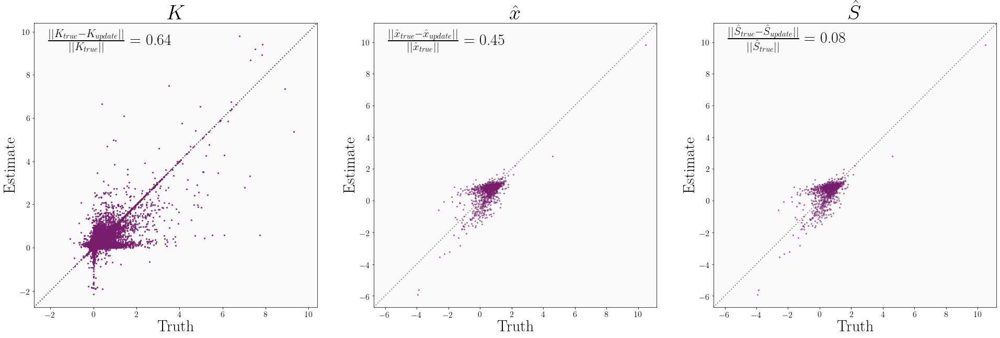

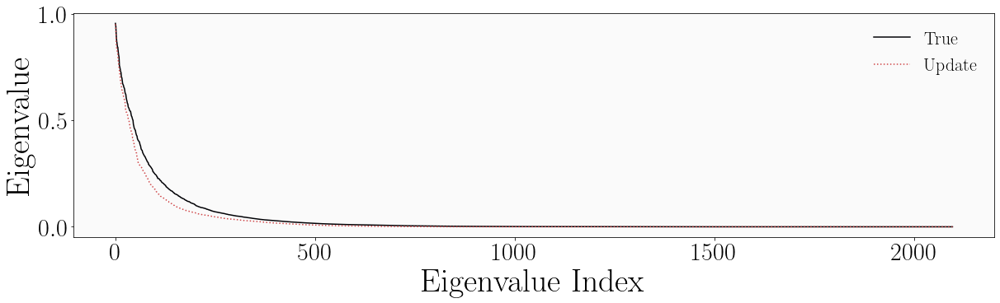

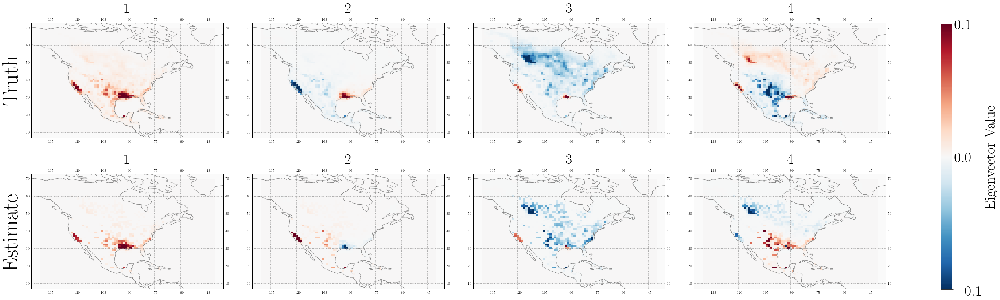

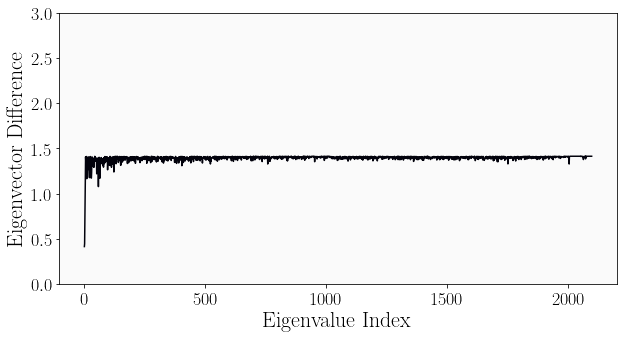

In [22]:
# Then, we test keeping high resolution for the top 100 cells
# and going to coarser resolution elsewhere.
test2 = est0.update_jacobian_ag(forward_model=true.k, 
                             clusters_plot=clusters_plot, 
                             pct_of_info=0.9,
                             n_cells=[100, 200],
                             n_cluster_size=[1, 2])
test2.full_analysis(true, clusters_plot)